# Model Experiments
This notebook is used to experiment with different model architectures, preprocessing techniques and more.
All setup can be specified in the beginning setup Dictionary.

# 00 Imports

In [1]:
import os
import numpy as np
import pandas as pd
import pickle
import datetime

from dataloader import dataloader

# Matplot Setup
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = (30,10)
plt.rcParams['figure.max_open_warning'] = 40
plt.style.use('fivethirtyeight')
plt.rcParams['lines.linewidth']= 1


In [2]:
# Tensorflow import:
import tensorflow as tf

import tensorflow.keras
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard
from tensorflow.keras.layers import Input, Dense, Dropout, GRU, LSTM, Concatenate, Reshape, Flatten, Lambda
from tensorflow.keras.layers import Conv2D, Conv1D
from keras.layers.pooling import MaxPooling2D, MaxPooling1D
from tensorflow.keras.regularizers import l2

2022-11-07 12:57:49.856664: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-07 12:57:50.060208: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-11-07 12:57:50.060328: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2022-11-07 12:57:50.105050: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-11-07 12:57:52.260734: W tensorflow/stream_executor/platform/de

# 01 Setup values

In [3]:
#setup_dict
sd= {
    # Basic setup stuff and paths
    'data_path':'Dataset/Converted_120Hz/',
    'model_dir': 'models_short/',
    'log_dir': 'tb_logs_short/',
    'seed':18,

    # Input and target parameters
    'f_params': ['position_0', 'position_1'],#, 'orientation.x', 'orientation.y', 'orientation.z', 'orientation.w']
    't_params': ['position_0', 'position_1'],

    # Dataset creation
    'downsample_rate': 10, # Hz; 10Hz -> 100ms per step
    
    'win_len': 100, # 6s
    'target_len': 5, # 500ms
    'stride': 1,

    # Preprocessing
    'normalize': 'minmax', #'std'
    'bounds': (-.2, .2),
    'minus': False, # creates minmax between [-1,1] instead of [0,1]
    'mu': False, # for std normalization

    'shuffle': True, # shuffle input data for first iteation (might be done by tf as well)

    # Model Setup is done in the model section

    # Training
    'lr' : 1e-3,
    'scheduler': True,
    'scheduler_samples': 3000,
    'optimizer': 'adam', #'rmsprop'
    'epochs': 1000,
    'b_size': 64,

    'loss': ['mean_absolute_error'],
    'metrics': ['acc', 'mean_absolute_error', 'mean_squared_error'],

    'callbacks': ['tensorboard', 'checkpointer', 'earlystopper'],
    'patience': 25,

    'model_ident':  'lmt_2_long'#'lmt2-ext'#'magnetic_a'#lmt1' # Identifier: lmt1: LMT paper conv Tamay, lmt2: LMT paper LSTM Dense, 'magnetic_a/b/c': Models from magnetic paper
}

np.random.seed(sd['seed'])
tf.random.set_seed(sd['seed'])

n_in_feats = len(sd['f_params'])
n_out_feats = len(sd['t_params'])

if sd['minus']:
    plot_bounds = [-1,1]
else:
    plot_bounds = [0,1]

# 02 Load Data

In [4]:
print(os.listdir(sd['data_path']))
data = dataloader(sd['data_path'], win_len = sd['win_len'], target_len = sd['target_len'], stride = sd['stride'], feature_params= sd['f_params'], 
                  target_params= sd['t_params'], test_split=0.08, val_split=0.08, seed=sd['seed'], downsample_rate=sd['downsample_rate'], stack=True)

X_train = data['X_train']
y_train = data['y_train']
X_val = data['X_val']
y_val = data['y_val']
X_test = data['X_test']
y_test = data['y_test']
sample_rate = data['sample_rate']

['2021-11-26-20-01-52_wobble_interpolated_120Hz.pickle', '2021-11-26-20-05-14_wobble_interpolated_120Hz.pickle', '2021-11-26-20-14-48_wobble_interpolated_120Hz.pickle', '2022-01-13-17-18-38_wobble_interpolated_120Hz.pickle', '2022-01-13-17-34-38_wobble_interpolated_120Hz.pickle', '2022-01-13-17-48-10_wobble_interpolated_120Hz.pickle', '2022-01-13-18-02-22_wobble_interpolated_120Hz.pickle', '2022-01-20-15-23-37_wobble_interpolated_120Hz.pickle', '2022-01-20-15-38-51_wobble_interpolated_120Hz.pickle']
2021-11-26-20-01-52_wobble_interpolated_120Hz.pickle
Downsampling Dictionary to 10Hz
Cutoff frequency: 5.0
Converted Signals: ['orientation.x', 'orientation.y', 'orientation.z', 'orientation.w', 'angular_velocity.x', 'angular_velocity.y', 'angular_velocity.z', 'linear_acceleration.x', 'linear_acceleration.y', 'linear_acceleration.z', 'position_0', 'position_1', 'position_0_status', 'position_1_status'].
	Before: Duration: 181.692s. Avg Sample Rate: 120.000/s. Number of samples: 21803.
	Afte

#### Sanity Check:
Overlay samples that come after each other and check for consistency. Also inspect all sampels stacked

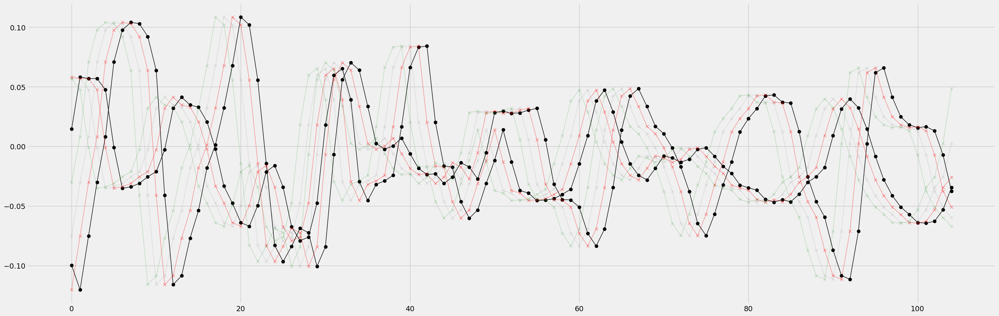

In [5]:
i = 300
plt.plot(np.vstack([X_train[i], y_train[i]]) , marker = 'o', color ='black')
plt.plot(np.vstack([X_train[i+1], y_train[i+1]]) , marker = 'x', alpha = 0.4, color ='red')
plt.plot(np.vstack([X_train[i+2], y_train[i+2]]) , marker = 'x', alpha =0.2, color = 'gray')
plt.plot(np.vstack([X_train[i+3], y_train[i+3]]) , marker = 'x', alpha =0.2, color = 'green')

(-1.0, 1.0)

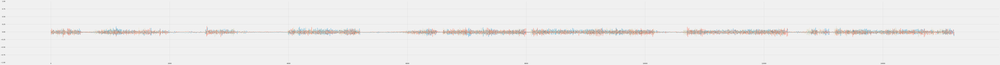

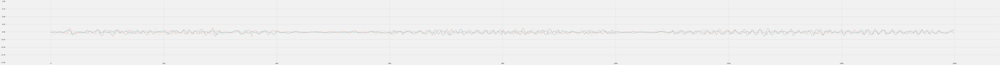

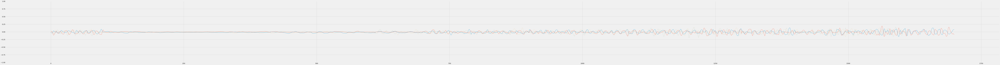

In [6]:
plt.rcParams['figure.figsize'] = (150,10)
plt.plot(np.vstack(X_train[::int(sd['win_len']/sd['stride'])]))
plt.plot(np.vstack(y_train[::int(sd['target_len']/sd['stride'])]), alpha = 0.3)
#plt.ylim([-.2, .2])
plt.ylim([-1, 1])

plt.figure()
plt.plot(np.vstack(X_val[::int(sd['win_len']/sd['stride'])]))
plt.plot(np.vstack(y_val[::int(sd['target_len']/sd['stride'])]), alpha = 0.3)
plt.ylim([-1, 1])

plt.figure()
plt.plot(np.vstack(X_test[::int(sd['win_len']/sd['stride'])]))
plt.plot(np.vstack(y_test[::int(sd['target_len']/sd['stride'])]), alpha = 0.3)
plt.ylim([-1, 1])

# 03 Preprocessing

## Normalization Functions
When recording the dataset, we realized that all feasible 'position_x' values lie at maximum between [-.4, .4]. Therefore a normalization between these values can be done. The bounds should always be symmetric around 0 to keep the 'balanced' 0 value in the middle of the resulting signal.

In [8]:
def minmax(X, bounds = None, minus = False):
    """
    Scales all signals in X to be between [0,1] or [-1,1] (if minus=True)
    :param X: Input Array
    :param bounds: Tuple of min and max values for scaling
    :param minus: If true, scales output between [-1, 1]
    """
    if bounds:
        min = bounds[0]
        max = bounds[1]
    else:
        min = np.amin(X)
        max = np.amax(X)
    
    if minus:
        X_minmax = 2*(X - min) / (max-min)-1
        a = X_minmax > 1
        b = X_minmax < -1
        X_minmax[a] = 1
        X_minmax[b] = -1
    else:
        X_minmax = (X - min) / (max-min)
        a = X_minmax > 1
        b = X_minmax < 0
        X_minmax[a] = 1
        X_minmax[b] = 0
    return X_minmax, [min, max]

def norm_std(X, mu = False):
    """
    Normalizes signals to ~ N(0,1)
    :param X: Input Array
    :param mu: shift by mean value
    """
    std = np.std(X)
    if mu:
        mu = np.mean(X)
        return (X-mu)/std, [mu, std] # Add std and mu values for outputs
    else:
        return X/np.std(X), [0, std] # Add std and mu values for outputs


def unison_shuffled_copies(a, b):
    """
    Randomly shuffle two arrays in unison
    """
    a_s = a.shape[0]
    p = np.random.permutation(a_s)
    return a[p], b[p]

## Preprocess Data
Apply the normalization functions to the data according to the setup dictionary

In [9]:
flag = False
prep_data = data.copy()
for k in data.keys():
    if k != 'sample_rate':
        if sd['normalize'] == 'minmax':
            prep_data[k], _ = minmax(prep_data[k], bounds = sd['bounds'], minus = sd['minus'])
            if not flag:
                print(f'Minmax normalized with bounds:', sd['bounds'])
                flag = True
        if sd['normalize'] == 'std':
            prep_data[k] = norm_std(prep_data[k], mu=sd['mu'])
            if not flag:
                print(f'Std normalized. Mu subtraction:', sd['mu'])
                flag = True

X_train = prep_data['X_train']
y_train = prep_data['y_train']
X_val = prep_data['X_val']
y_val = prep_data['y_val']
X_test = prep_data['X_test']
y_test = prep_data['y_test']
sample_rate = prep_data['sample_rate']

if sd['shuffle']:
    print('Shuffled all data.')
    X_train, y_train = unison_shuffled_copies(X_train, y_train)
    X_val, y_val = unison_shuffled_copies(X_val, y_val)
    X_test, y_test = unison_shuffled_copies(X_test, y_test)

print('Train set: ', X_train.shape, y_train.shape, '\nValidation set: ', X_val.shape, y_val.shape, '\nTest set: ', X_test.shape, y_test.shape)


Minmax normalized with bounds: (-0.2, 0.2)
Shuffled all data.
Train set:  (15130, 100, 2) (15130, 5, 2) 
Validation set:  (1539, 100, 2) (1539, 5, 2) 
Test set:  (1609, 100, 2) (1609, 5, 2)


#### Sanity Check: 
Plot all Xs and their corresponding ys overlayed to make sense. The most part of the signal has to be in unison. The differences come from the data split

(15130,)


(0.47942330275565764,
 0.09689626923190868,
 0.06633816825805487,
 0.9495182960072225)

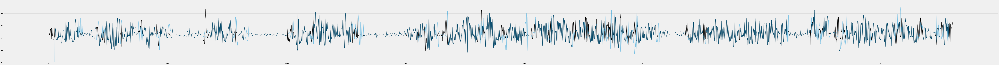

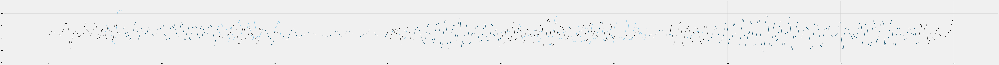

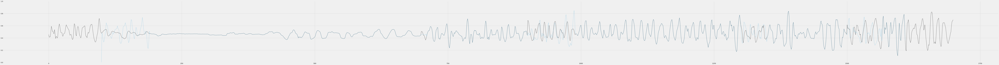

In [10]:
X_tr = prep_data['X_train'][:,:,0]
X_v = prep_data['X_val'][:,:,0]
X_te = prep_data['X_test'][:,:,0]

plt.figure()
plt.plot(np.hstack(X_tr[::int(sd['win_len']/sd['stride'])]), color ='black')
n_y = np.vstack(prep_data['y_train'][::int(sd['target_len']/sd['stride'])])[:,0]
n_y = np.hstack([np.zeros(sd['win_len']), n_y[:-sd['win_len']]])
print(n_y.shape)
plt.plot(n_y, alpha = 0.5)
plt.ylim(plot_bounds)

plt.figure()
plt.plot(np.hstack(X_v[::int(sd['win_len']/sd['stride'])]), color ='black')
n_y_2 = np.vstack(prep_data['y_val'][::int(sd['target_len']/sd['stride'])])[:,0]
n_y_2 = np.hstack([np.zeros(sd['win_len']), n_y_2[:-sd['win_len']]])
plt.plot(n_y_2, alpha = 0.5)
plt.ylim(plot_bounds)

plt.figure()
plt.plot(np.hstack(X_te[::int(sd['win_len']/sd['stride'])]), color ='black')
n_y_3 = np.vstack(prep_data['y_test'][::int(sd['target_len']/sd['stride'])])[:,0]
n_y_3 = np.hstack([np.zeros(sd['win_len']), n_y_3[:-sd['win_len']]])
plt.plot(n_y_3, alpha = 0.5)
plt.ylim(plot_bounds)

np.mean(X_tr), np.std(X_tr), np.min(X_tr), np.max(X_tr)

(15235,)


(0.47536876323864147,
 0.09571433182312476,
 0.012534883823523899,
 0.9783198015864472)

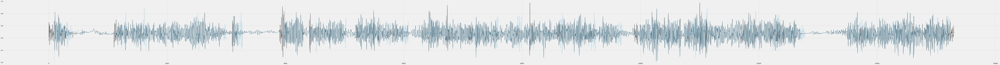

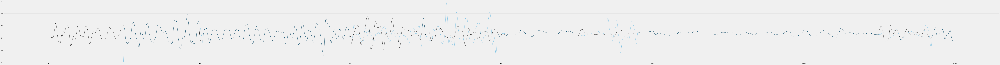

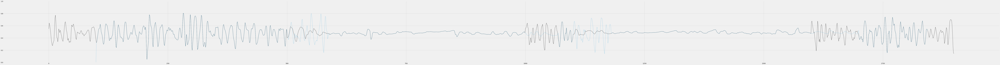

In [13]:
X_tr = prep_data['X_train'][:,:,1]
X_v = prep_data['X_val'][:,:,1]
X_te = prep_data['X_test'][:,:,1]

plt.figure()
plt.plot(np.hstack(X_tr[::int(sd['win_len']/sd['stride'])]), color ='black')
n_y = np.vstack(prep_data['y_train'][::int(sd['target_len']/sd['stride'])])[:,1]
n_y = np.hstack([np.zeros(sd['win_len']), n_y[:-sd['win_len']]])
print(n_y.shape)
plt.plot(n_y, alpha = 0.5)
plt.ylim(plot_bounds)

plt.figure()
plt.plot(np.hstack(X_v[::int(sd['win_len']/sd['stride'])]), color ='black')
n_y_2 = np.vstack(prep_data['y_val'][::int(sd['target_len']/sd['stride'])])[:,1]
n_y_2 = np.hstack([np.zeros(sd['win_len']), n_y_2[:-sd['win_len']]])
plt.plot(n_y_2, alpha = 0.5)
plt.ylim(plot_bounds)

plt.figure()
plt.plot(np.hstack(X_te[::int(sd['win_len']/sd['stride'])]), color ='black')
n_y_3 = np.vstack(prep_data['y_test'][::int(sd['target_len']/sd['stride'])])[:,1]
n_y_3 = np.hstack([np.zeros(sd['win_len']), n_y_3[:-sd['win_len']]])
plt.plot(n_y_3, alpha = 0.5)
plt.ylim(plot_bounds)

np.mean(X_tr), np.std(X_tr), np.min(X_tr), np.max(X_tr)

# 04 Splitter, Predictor and Plotter Util Fcts

In [14]:
def plot_all(prediction, ground_truth, name = '', win_len = sd['win_len'], target_len= sd['target_len'], stride = sd['stride'], plot_bounds = plot_bounds, save_plots = None):
    #ToDo: Clean Up and document
    """
    Plot all signal predictions compared to the ground truth values
    """
    stacked_gt = np.vstack(ground_truth[::int(target_len/stride)])
    stacked_pred = np.vstack(prediction[::int(target_len/stride)])
    
    plt.figure()
    plt.plot(stacked_gt[:,0], label = f'ground truth {name}', color = 'black')
    plt.plot(stacked_pred[:,0], label = f'prediction {name}', color = 'chocolate', alpha = 0.6,linewidth =2)
    plt.ylim(plot_bounds)
    plt.xlabel('Time')
    plt.ylabel('Amplitde')
    plt.legend()
    plt.title(f'Stacked Predictions vs round Truth for {name}. Position_0');
    if save_plots:
        plt.savefig(f'{save_plots}full_{name}_p0.png')

    plt.figure()
    plt.plot(stacked_gt[:,1], label = f'ground truth {name}', color = 'black')
    plt.plot(stacked_pred[:,1], label = f'prediction {name}', color = 'chocolate', alpha = 0.6,linewidth =2)
    plt.ylim(plot_bounds)
    plt.xlabel('Time [s/10]')
    plt.ylabel('Amplitude')
    plt.legend()
    plt.title(f'Stacked Predictions vs round Truth for {name}. Position_1');
    if save_plots:
        plt.savefig(f'{save_plots}full_{name}_p0.png')

def plot_one(prediction, ground_truth, x_in, name = '', plot_bounds = plot_bounds, save_plots = None):
    plt.figure()
    #print(x_in.shape, ground_truth.shape, prediction.shape)
    plt.plot(np.vstack([x_in, ground_truth]), label = f'ground truth {name}', color = 'black', marker = 'x')
    plt.plot(np.vstack([x_in, prediction]), label = f'prediction {name}', alpha = 0.8, marker = 'o')
    plt.ylim(plot_bounds)
    plt.title(f'Prediction for: {name}')
    plt.xlabel('Time [s/10]')
    plt.ylabel('Amplitude')
    plt.axvline(sd['win_len']-1, color ='green', linewidth = 4, alpha=.3)
    plt.legend();
    if save_plots:
        plt.savefig(f'{save_plots}sample_{name}.png')

def plot_compare(model, single = True, all = True, data = prep_data, samples = [0, 100, -100, -1], win_len = sd['win_len'], target_len = sd['target_len'], stride = sd['stride'], save_plots = None):
    p_tr = model.predict(prep_data['X_train'])
    p_val = model.predict(prep_data['X_val'])
    p_te = model.predict(prep_data['X_test'])

    if save_plots:
        if not os.path.exists(save_plots):
            os.makedirs(save_plots)

    if single:
        for i in samples:
            plt.figure()
            plot_one(p_tr[i], prep_data['y_train'][i], prep_data['X_train'][i], name = f'train {i}', save_plots=save_plots)
        
        for i in samples:
            plt.figure()
            plot_one(p_val[i], prep_data['y_val'][i], prep_data['X_val'][i], name = f'val {i}', save_plots=save_plots)
        
        for i in samples:
            plt.figure()
            plot_one(p_te[i], prep_data['y_test'][i], prep_data['X_test'][i], name = f'test {i}', save_plots=save_plots)
    if all:
        plt.rcParams['figure.figsize'] = (110,10)
        plot_all(p_tr, prep_data['y_train'], name ='Train Set', save_plots=save_plots)
        plot_all(p_val, prep_data['y_val'], name ='Validation Set', save_plots=save_plots)
        plot_all(p_te, prep_data['y_test'], name ='Test Set', save_plots=save_plots)
        plt.rcParams['figure.figsize'] = (50,10)

# 05 Build model

## Model 01: GRU + Conv (lmt1)
Based on:
https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8633843

In [13]:
# ToDo: Put in Function
sd['n_nodes'] = 30
sd['n_conv_filters_1D'] = 10
sd['n_conv_filters'] = 10
sd['k_size'] = 30
sd['dropout'] = 0.2

inputs = Input([sd['win_len'],n_in_feats])
split = Lambda(lambda x: tf.split(x,num_or_size_splits=2,axis=2))(inputs)

# Convolution layers
c_1 = Conv1D(filters = sd['n_conv_filters_1D'], kernel_size = 3, padding='same', name='c_1') (split[0]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
c_2 = Conv1D(filters = sd['n_conv_filters_1D'], kernel_size = 3, padding='same', name='c_2') (split[1]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)

## Layer 1 (in)
in_gru_1 = Concatenate(axis=2, name='in_gru_1')([c_1,c_2]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
gru_1 = GRU(sd['n_nodes'], return_sequences=True, name ='gru_1')(in_gru_1) # (None, 30, n_nodes)
dropout_1 = Dropout(sd['dropout'])(gru_1)
conv_1 = Conv1D(sd['n_conv_filters'], kernel_size = sd['k_size'],  padding = 'same', name ='conv_1', activation='relu')(dropout_1)

# Layer 2
gru_2 = GRU(sd['n_nodes'], return_sequences=True, name ='gru_2')(conv_1)
dropout_2 = Dropout(sd['dropout'])(gru_2)
conv_2 = Conv1D(sd['n_conv_filters'], kernel_size = sd['k_size'],  padding = 'same', name ='conv_2', activation='relu')(dropout_2)

# Layer 3
gru_3 = GRU(sd['n_nodes'], return_sequences=True, name ='gru_3')(conv_2)
dropout_3 = Dropout(sd['dropout'])(gru_3)
conv_3 = Conv1D(sd['n_conv_filters'], kernel_size = sd['k_size'],  padding = 'same', name ='conv_3', activation='relu')(dropout_3)

# Layer 4
gru_4 = GRU(sd['n_nodes'], return_sequences=True, name ='gru_4')(conv_3)
dropout_4 = Dropout(sd['dropout'])(gru_4)
conv_4 = Conv1D(sd['n_conv_filters'], kernel_size = sd['k_size'],  padding = 'same', name ='conv_4', activation='relu')(dropout_4)

# Layer 5
gru_5 = GRU(sd['n_nodes'], return_sequences=True, name ='gru_5')(conv_4)
dropout_5 = Dropout(sd['dropout'])(gru_5)
conv_5 = Conv1D(sd['n_conv_filters'], kernel_size = sd['k_size'],  padding = 'same', name ='conv_5', activation='relu')(dropout_5)

# Layer 5
gru_6 = GRU(sd['n_nodes'], return_sequences=True, name ='gru_6')(conv_5)
dropout_6 = Dropout(sd['dropout'])(gru_6)
conv_6 = Conv1D(sd['n_conv_filters'], kernel_size = sd['k_size'],  padding = 'same', name ='conv_6', activation='relu')(dropout_6)

# Pooling
re_1 = Reshape([conv_6.shape[1], conv_6.shape[2], 1], name='re_1')(conv_6)
mp_1 = MaxPooling2D((1,sd['n_conv_filters']), name = 'mp_1')(re_1)
re_2 = Reshape([sd['win_len'], 1], name='re_2')(mp_1)

# Dense Output
d_1 = Dense(sd['target_len']*n_out_feats, activation='relu', name='d_5')(re_2)
d_f = Flatten(name='d_f')(d_1)
dense_out = Dense(sd['target_len']*n_out_feats, activation = 'relu', name='dense_out')(d_f)

output = Reshape([sd['target_len'], n_out_feats], name='output')(dense_out)

model = Model(inputs=[inputs], outputs=[output])
model.summary()

2022-01-25 23:04:50.715893: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-01-25 23:04:50.715933: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (yoga): /proc/driver/nvidia/version does not exist
2022-01-25 23:04:50.716343: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 30, 2)]      0           []                               
                                                                                                  
 lambda (Lambda)                [(None, 30, 1),      0           ['input_1[0][0]']                
                                 (None, 30, 1)]                                                   
                                                                                                  
 c_1 (Conv1D)                   (None, 30, 10)       40          ['lambda[0][0]']                 
                                                                                                  
 c_2 (Conv1D)                   (None, 30, 10)       40          ['lambda[0][1]']             

## Model 02: Interleaved FFN + LSTM (lmt2)
Based on:
https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8429079 (model a)

In [15]:
# ToDo: Put in function
sd['n_nodes'] = 9
sd['n_conv_filters'] = 32
sd['dropout'] = 0.0#2
sd['l2'] = 0#1e-5

inputs = Input([sd['win_len'],n_in_feats])
split = Lambda(lambda x: tf.split(x,num_or_size_splits=2,axis=2))(inputs)

# Convolution layers
c_1 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_1') (split[0]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
c_2 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_2') (split[1]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)

## Layer 1 (in)
in_lstm_1 = Concatenate(axis=2, name='in_lstm_1')([c_1,c_2]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
lstm_1 = LSTM(sd['n_nodes'], return_sequences=True, stateful=False,  name ='lstm_1')(in_lstm_1) # (None, 30, 9)

in_d_1 = Concatenate(axis=2, name='in_d_1')([in_lstm_1, lstm_1]) # (None, 30, 11) or (None, 30, 9 + 2*n_filters)
dropout_1 = Dropout(sd['dropout'])(in_d_1)
d_1 = Dense(sd['n_nodes'], activation='relu', name='d_1', kernel_regularizer=l2(l2=sd['l2']))(dropout_1) # (None, 30, 9)

## Layer 2
in_lstm_2 = Concatenate(axis=2)([lstm_1, d_1]) # (None, 30, 18)
lstm_2 = LSTM(sd['n_nodes'], return_sequences=True, stateful=False, name='lstm_2')(in_lstm_2) # (None, 30, 9)

in_d_2 = Concatenate(axis=2, name='in_d_2')([lstm_2, d_1])
dropout_2 = Dropout(sd['dropout'])(in_d_2)
d_2 = Dense(sd['n_nodes'], activation='relu', name='d_2', kernel_regularizer=l2(l2=sd['l2']))(dropout_2)# input (lstm_2, d_1) out (None, 30, 9)

## Layer 3
in_lstm_3 = Concatenate(axis=2, name='in_lstm_3')([lstm_2, d_2])
lstm_3 = LSTM(sd['n_nodes'], return_sequences=True, stateful=False, name='lstm_3')(in_lstm_3)

in_d_3 = Concatenate(axis=2, name='in_d_3')([lstm_3, d_2]) # input (None, 30, 18) output (None, 30, 9)
dropout_3 = Dropout(sd['dropout'])(in_d_3)
d_3 = Dense(sd['n_nodes'], activation='relu', name='d_3', kernel_regularizer=l2(l2=sd['l2']))(dropout_3)

## Layer 4
in_lstm_4 = Concatenate(axis=2, name='in_lstm_4')([lstm_3, d_3])
lstm_4 = LSTM(sd['n_nodes'], return_sequences=True, stateful=False, name='lstm_4')(in_lstm_4)

in_d_4 = Concatenate(axis=2, name='in_d_4')([lstm_4, d_3])
dropout_4 = Dropout(sd['dropout'])(in_d_4)
d_4 = Dense(sd['n_nodes'], activation='relu', name='d_4', kernel_regularizer=l2(l2=sd['l2']))(dropout_4)

## Layer 5 (out)
in_lstm_5 = Concatenate(axis=2, name='in_lstm_5')([lstm_4, d_4])
lstm_5 = LSTM(sd['n_nodes'], return_sequences=True, stateful=False, name='lstm_5')(in_lstm_5)

# Output
d_5 = Dense(sd['target_len']*n_out_feats, activation='relu', name='d_5', kernel_regularizer=l2(l2=sd['l2']))(lstm_5)
d_f = Flatten(name='d_f')(d_5)
dropout_6 = Dropout(sd['dropout'])(d_f)
dense_out = Dense(sd['target_len']*n_out_feats, activation = 'relu', name='dense_out', kernel_regularizer=l2(l2=sd['l2']))(d_f)

output = Reshape([sd['target_len'], n_out_feats])(dense_out)

model = Model(inputs=[inputs], outputs=[output])
model.summary()

2022-01-29 21:46:31.773897: E tensorflow/stream_executor/cuda/cuda_driver.cc:271] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2022-01-29 21:46:31.773956: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (yoga): /proc/driver/nvidia/version does not exist
2022-01-29 21:46:31.774405: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 100, 2)]     0           []                               
                                                                                                  
 lambda (Lambda)                [(None, 100, 1),     0           ['input_1[0][0]']                
                                 (None, 100, 1)]                                                  
                                                                                                  
 c_1 (Conv1D)                   (None, 100, 32)      128         ['lambda[0][0]']                 
                                                                                                  
 c_2 (Conv1D)                   (None, 100, 32)      128         ['lambda[0][1]']             

## Model 03: Interleaved FFN + LSTM Extendend (lmt2-ext)
Based on:
https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8429079 (model a)

In [18]:
# To Do: Put in Function
sd['n_nodes'] = 9
sd['n_conv_filters'] = 16
sd['dropout'] = 0.3
sd['l2'] = 1e-5

inputs = Input([sd['win_len'],n_in_feats])
split = Lambda(lambda x: tf.split(x,num_or_size_splits=2,axis=2))(inputs)

# Convolution layers
c_1 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_1') (split[0]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
c_2 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_2') (split[1]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)

## Layer 1 (in)
in_lstm_1 = Concatenate(axis=2, name='in_lstm_1')([c_1,c_2]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
lstm_1 = LSTM(sd['n_nodes'], return_sequences=True, name ='lstm_1')(in_lstm_1) # (None, 30, 9)

in_d_1 = Concatenate(axis=2, name='in_d_1')([in_lstm_1, lstm_1]) # (None, 30, 11) or (None, 30, 9 + 2*n_filters)
dropout_1 = Dropout(sd['dropout'])(in_d_1)
d_1 = Dense(sd['n_nodes'], activation='relu', name='d_1', kernel_regularizer=l2(l2=sd['l2']))(dropout_1) # (None, 30, 9)

## Layer 2
in_lstm_2 = Concatenate(axis=2)([lstm_1, d_1]) # (None, 30, 18)
lstm_2 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_2')(in_lstm_2) # (None, 30, 9)

in_d_2 = Concatenate(axis=2, name='in_d_2')([lstm_2, d_1])
dropout_2 = Dropout(sd['dropout'])(in_d_2)
d_2 = Dense(sd['n_nodes'], activation='relu', name='d_2', kernel_regularizer=l2(l2=sd['l2']))(dropout_2)# input (lstm_2, d_1) out (None, 30, 9)

## Layer 3
in_lstm_3 = Concatenate(axis=2, name='in_lstm_3')([lstm_2, d_2])
lstm_3 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_3')(in_lstm_3)

in_d_3 = Concatenate(axis=2, name='in_d_3')([lstm_3, d_2]) # input (None, 30, 18) output (None, 30, 9)
dropout_3 = Dropout(sd['dropout'])(in_d_3)
d_3 = Dense(sd['n_nodes'], activation='relu', name='d_3', kernel_regularizer=l2(l2=sd['l2']))(dropout_3)

## Layer 4
in_lstm_4 = Concatenate(axis=2, name='in_lstm_4')([lstm_3, d_3])
lstm_4 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_4')(in_lstm_4)

in_d_4 = Concatenate(axis=2, name='in_d_4')([lstm_4, d_3])
dropout_4 = Dropout(sd['dropout'])(in_d_4)
d_4 = Dense(sd['n_nodes'], activation='relu', name='d_4', kernel_regularizer=l2(l2=sd['l2']))(dropout_4)

## Layer 5
in_lstm_5 = Concatenate(axis=2, name='in_lstm_5')([lstm_4, d_4])
lstm_5 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_5')(in_lstm_5)

in_d_5 = Concatenate(axis=2, name='in_d_5')([lstm_5, d_3])
dropout_5 = Dropout(sd['dropout'])(in_d_5)
d_5 = Dense(sd['n_nodes'], activation='relu', name='d_5', kernel_regularizer=l2(l2=sd['l2']))(dropout_5)

## Layer 6
in_lstm_6 = Concatenate(axis=2, name='in_lstm_6')([lstm_5, d_5])
lstm_6 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_6')(in_lstm_6)

in_d_6 = Concatenate(axis=2, name='in_d_6')([lstm_6, d_5])
dropout_6 = Dropout(sd['dropout'])(in_d_6)
d_6 = Dense(sd['n_nodes'], activation='relu', name='d_6', kernel_regularizer=l2(l2=sd['l2']))(dropout_6)


## Layer 7 (out)
in_lstm_7 = Concatenate(axis=2, name='in_lstm_7')([lstm_6, d_6])
lstm_7 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_7')(in_lstm_7)

# Output
d_7 = Dense(sd['target_len']*n_out_feats, activation='relu', name='d_7', kernel_regularizer=l2(l2=sd['l2']))(lstm_7)
d_f = Flatten(name='d_f')(d_7)
dropout_6 = Dropout(sd['dropout'])(d_f)
dense_out = Dense(sd['target_len']*n_out_feats, activation = 'relu', name='dense_out', kernel_regularizer=l2(l2=sd['l2']))(d_f)

output = Reshape([sd['target_len'], n_out_feats])(dense_out)

model = Model(inputs=[inputs], outputs=[output])
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 30, 2)]      0           []                               
                                                                                                  
 lambda_3 (Lambda)              [(None, 30, 1),      0           ['input_4[0][0]']                
                                 (None, 30, 1)]                                                   
                                                                                                  
 c_1 (Conv1D)                   (None, 30, 16)       64          ['lambda_3[0][0]']               
                                                                                                  
 c_2 (Conv1D)                   (None, 30, 16)       64          ['lambda_3[0][1]']         

## Model 04: Interleaved FFN + LSTM + Conv (lmt2-conv)

In [19]:
sd['n_nodes'] = 9
sd['n_conv_filters'] = 24
sd['dropout'] = 0.1
sd['l2'] = 1e-6

inputs = Input([sd['win_len'],n_in_feats])
split = Lambda(lambda x: tf.split(x,num_or_size_splits=2,axis=2))(inputs)

# Convolution layers
c_1 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_1') (split[0]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
c_2 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_2') (split[1]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)

## Layer 1 (in)
in_lstm_1 = Concatenate(axis=2, name='in_lstm_1')([c_1,c_2]) # (None, 30, 1) or (None, 30, 2*nfilters_conv)
lstm_1 = LSTM(sd['n_nodes'], return_sequences=True, name ='lstm_1')(in_lstm_1) # (None, 30, 9)

in_d_1 = Concatenate(axis=2, name='in_d_1')([in_lstm_1, lstm_1]) # (None, 30, 11) or (None, 30, 9 + 2*n_filters)
dropout_1 = Dropout(sd['dropout'])(in_d_1)
d_1 = Dense(sd['n_nodes'], activation='relu', name='d_1', kernel_regularizer=l2(l2=sd['l2']))(dropout_1) # (None, 30, 9)

## Layer 2
in_lstm_2 = Concatenate(axis=2)([lstm_1, d_1]) # (None, 30, 18)
lstm_2 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_2')(in_lstm_2) # (None, 30, 9)

in_d_2 = Concatenate(axis=2, name='in_d_2')([lstm_2, d_1])
dropout_2 = Dropout(sd['dropout'])(in_d_2)
d_2 = Dense(sd['n_nodes'], activation='relu', name='d_2', kernel_regularizer=l2(l2=sd['l2']))(dropout_2)# input (lstm_2, d_1) out (None, 30, 9)

## Layer 3
in_lstm_3 = Concatenate(axis=2, name='in_lstm_3')([lstm_2, d_2])
lstm_3 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_3')(in_lstm_3)

in_d_3 = Concatenate(axis=2, name='in_d_3')([lstm_3, d_2]) # input (None, 30, 18) output (None, 30, 9)
dropout_3 = Dropout(sd['dropout'])(in_d_3)
d_3 = Dense(sd['n_nodes'], activation='relu', name='d_3', kernel_regularizer=l2(l2=sd['l2']))(dropout_3)

## Layer 4
in_lstm_4 = Concatenate(axis=2, name='in_lstm_4')([lstm_3, d_3])
lstm_4 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_4')(in_lstm_4)

in_d_4 = Concatenate(axis=2, name='in_d_4')([lstm_4, d_3])
dropout_4 = Dropout(sd['dropout'])(in_d_4)
d_4 = Dense(sd['n_nodes'], activation='relu', name='d_4', kernel_regularizer=l2(l2=sd['l2']))(dropout_4)

## Layer 5 (out)
in_lstm_5 = Concatenate(axis=2, name='in_lstm_5')([lstm_4, d_4])
lstm_5 = LSTM(sd['n_nodes'], return_sequences=True, name='lstm_5')(in_lstm_5)

# Output
d_5 = Dense(sd['target_len']*n_out_feats, activation='relu', name='d_5', kernel_regularizer=l2(l2=sd['l2']))(lstm_5)

c_3 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_3') (d_5)
c_4 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_4') (c_3)

m_1 = MaxPooling1D(2)(c_4)

c_5 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_5') (m_1)
c_6 = Conv1D(filters = sd['n_conv_filters'], kernel_size = 3, padding='same', name='c_6') (c_5)

d_f = Flatten(name='d_f')(c_6)
dropout_6 = Dropout(sd['dropout'])(d_f)
dense_out = Dense(sd['target_len']*n_out_feats, activation = 'relu', name='dense_out', kernel_regularizer=l2(l2=sd['l2']))(d_f)

output = Reshape([sd['target_len'], n_out_feats])(dense_out)

model = Model(inputs=[inputs], outputs=[output])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 30, 2)]      0           []                               
                                                                                                  
 lambda_4 (Lambda)              [(None, 30, 1),      0           ['input_5[0][0]']                
                                 (None, 30, 1)]                                                   
                                                                                                  
 c_1 (Conv1D)                   (None, 30, 24)       96          ['lambda_4[0][0]']               
                                                                                                  
 c_2 (Conv1D)                   (None, 30, 24)       96          ['lambda_4[0][1]']         

## Model 05: LSTM simple (magnetic_a)
(Yiming) <br>
Based on:
https://www.researchgate.net/publication/354638949_Deep_Fusion_of_a_Skewed_Redundant_Magnetic_and_Inertial_Sensor_for_Heading_State_Estimation_in_a_Saturated_Indoor_Environment

In [11]:
# ToDo: Put in function
sd['n_nodes'] = 27
sd['drop_rate'] = 0.15

inputs = Input([sd['win_len'],n_in_feats])

lstm_1 = LSTM(sd['n_nodes'], return_sequences=True, name ='lstm_1')(inputs) # (None, 30, 27)
dropout_1 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_1')(lstm_1)

lstm_2 = LSTM(sd['n_nodes'], return_sequences=True, name ='lstm_2')(dropout_1) # (None, 30, 27)
dropout_2 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_2')(lstm_2)

d_1 = Dense(27, activation='relu', name='d_1')(dropout_2)  # first dense layer with 27 units

d_2 = Dense(2, activation='relu', name='d_2')(d_1)  # second dense layer with 1 units(?)
d_f = Flatten(name='d_f')(d_2)
dense_out = Dense(sd['target_len']*n_out_feats, activation = 'relu', name='dense_out')(d_f)

output = Reshape([sd['target_len'], n_out_feats])(dense_out)

model = Model(inputs=[inputs], outputs=[output],name='model_a')
model.summary()

2022-11-07 13:05:51.124517: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-11-07 13:05:51.124560: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-11-07 13:05:51.124586: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (yoga): /proc/driver/nvidia/version does not exist
2022-11-07 13:05:51.125485: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Model: "model_a"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 2)]          0         
                                                                 
 lstm_1 (LSTM)               (None, 100, 27)           3240      
                                                                 
 dropout_1 (Dropout)         (None, 100, 27)           0         
                                                                 
 lstm_2 (LSTM)               (None, 100, 27)           5940      
                                                                 
 dropout_2 (Dropout)         (None, 100, 27)           0         
                                                                 
 d_1 (Dense)                 (None, 100, 27)           756       
                                                                 
 d_2 (Dense)                 (None, 100, 2)            56  

## Model 06: LSTM all subdivided (magnetic_b)
(Yiming) <br>
Based on: https://www.researchgate.net/publication/354638949_Deep_Fusion_of_a_Skewed_Redundant_Magnetic_and_Inertial_Sensor_for_Heading_State_Estimation_in_a_Saturated_Indoor_Environment

In [14]:
# ToDo: Put in Function
sd['n_nodes_1'] = 10
sd['n_nodes_2'] = 30
sd['drop_rate'] = 0.15

inputs = Input([sd['win_len'],n_in_feats])
split = Lambda(lambda x: tf.split(x,num_or_size_splits=2,axis=2))(inputs)

lstm_1 = LSTM(sd['n_nodes_1'], return_sequences=True, name ='lstm_1')(split[0]) # (None, 30, 9)
dropout_1 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_1')(lstm_1)

lstm_2 = LSTM(sd['n_nodes_1'], return_sequences=True, name ='lstm_2')(split[1]) # (None, 30, 9)
dropout_2 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_2')(lstm_2)

in_lstm_3 = Concatenate(axis=2, name='in_lstm_3')([dropout_1,dropout_2])
lstm_3 = LSTM(sd['n_nodes_2'], return_sequences=True, name ='lstm_3')(in_lstm_3)
dropout_3 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_3')(lstm_3)

d_1 = Dense(27, activation='relu', name='d_1')(dropout_3)  # first dense layer with 27 units

d_2 = Dense(2, activation='relu', name='d_2')(d_1)  # second dense layer with 1 units(?)
d_f = Flatten(name='d_f')(d_2)
dense_out = Dense(sd['target_len']*n_out_feats, activation = 'relu', name='dense_out')(d_f)

output = Reshape([sd['target_len'], n_out_feats])(dense_out)

model = Model(inputs=[inputs], outputs=[output],name='model_b')
model.summary()


Model: "model_b"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 30, 2)]      0           []                               
                                                                                                  
 lambda_1 (Lambda)              [(None, 30, 1),      0           ['input_2[0][0]']                
                                 (None, 30, 1)]                                                   
                                                                                                  
 lstm_1 (LSTM)                  (None, 30, 10)       480         ['lambda_1[0][0]']               
                                                                                                  
 lstm_2 (LSTM)                  (None, 30, 10)       480         ['lambda_1[0][1]']         

## Model 07: LSTM Dense (magnetic_c)
(Yiming)
Based on: https://www.researchgate.net/publication/354638949_Deep_Fusion_of_a_Skewed_Redundant_Magnetic_and_Inertial_Sensor_for_Heading_State_Estimation_in_a_Saturated_Indoor_Environment

In [22]:
# ToDo: Put in Function
sd['n_nodes'] = 27
sd['drop_rate'] = 0.15

inputs = Input([sd['win_len'],n_in_feats])

lstm_1 = LSTM(sd['n_nodes'], return_sequences=True, name ='lstm_1')(inputs)
dropout_1 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_1')(lstm_1)

lstm_2 = LSTM(sd['n_nodes'], return_sequences=True, name ='lstm_2')(dropout_1)
dropout_2 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_2')(lstm_2)

lstm_3 = LSTM(sd['n_nodes'], return_sequences=True, name ='lstm_3')(dropout_2)
dropout_3 = Dropout(sd['drop_rate'], seed=sd['seed'], name ='dropout_3')(lstm_3)

d_1 = Dense(sd['n_nodes'], activation='relu', name='d_1')(dropout_3) 
d_2 = Dense(n_out_feats, activation='relu', name='d_2')(d_1) # n_out_feats = 2

d_f = Flatten(name='d_f')(d_2)
dense_out = Dense(sd['target_len']*n_out_feats, activation = 'relu', name='dense_out')(d_f)

output = Reshape([sd['target_len'], n_out_feats])(dense_out)

model = Model(inputs=[inputs], outputs=[output],name='model_c')
model.summary()

Model: "model_c"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 30, 2)]           0         
                                                                 
 lstm_1 (LSTM)               (None, 30, 27)            3240      
                                                                 
 dropout_1 (Dropout)         (None, 30, 27)            0         
                                                                 
 lstm_2 (LSTM)               (None, 30, 27)            5940      
                                                                 
 dropout_2 (Dropout)         (None, 30, 27)            0         
                                                                 
 lstm_3 (LSTM)               (None, 30, 27)            5940      
                                                                 
 dropout_3 (Dropout)         (None, 30, 27)            0   

# 06 Training
#### Setup

In [16]:
# Set Optimizer, Loss and metrics
if sd['scheduler']:
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(sd['lr'], decay_steps=sd['scheduler_samples'], decay_rate=0.96, staircase=True)

if sd['optimizer'] == 'adam':
    if sd['scheduler']:
        opt = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
    else:
        opt = tf.keras.optimizers.Adam(learning_rate=sd['lr'])
if sd['optimizer'] == 'rmsprop':
    if sd['scheduler']:
        opt = tf.keras.optimizers.RMSprop(learning_rate=lr_schedule)
    else:
        opt = tf.keras.optimizers.RMSprop(learning_rate=sd['lr'])

model.compile(optimizer=opt, loss=sd['loss'], metrics=sd['metrics'])


In [17]:
# Callbacks
time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
sd['model_dir_save'] = sd['model_dir'] + time + '_' + sd['model_ident'] + '/'
save_name = time + '_' + sd['model_ident']

callbacks = []
if 'tensorboard' in sd['callbacks']:
    callbacks.append(TensorBoard(log_dir= sd['log_dir'] + save_name + '/', histogram_freq=1))

if 'earlystopper' in sd['callbacks']:
    callbacks.append(EarlyStopping(patience=sd['patience'], verbose=1))
    
if 'checkpointer' in sd['callbacks']:
    callbacks.append(ModelCheckpoint(filepath=sd['model_dir_save'] + save_name,
                                     save_weights_only=True, verbose=False, save_best_only=True))

In [18]:
sd['model_dir'], sd['model_dir_save'], sd['log_dir'], save_name

('models_short/',
 'models_short/20220129-214702_lmt_2_long/',
 'tb_logs_short/',
 '20220129-214702_lmt_2_long')

#### Start Training

In [19]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

if not os.path.exists(sd['model_dir']):
    os.makedirs(sd['model_dir'])
if not os.path.exists(sd['model_dir_save']):
    os.makedirs(sd['model_dir_save'])
print(f'#########\t\t\t\tCurrent setup values: \t\t\t\t#########')

for k,i in sd.items():
    print(f'{k:10}\t\t{i}')
print('[STARTING TRAINING]')
history = model.fit(X_train, y_train, batch_size=sd['b_size'], epochs = sd['epochs'], verbose=True, validation_data=(X_val, y_val), callbacks = callbacks)

save_dict = sd.copy()
save_dict['history'] = history
#tf.keras.models.save_model(model, sd['model_dir_save'])
model.save(filepath=sd['model_dir_save'] + save_name + '.h5')


with open(sd['model_dir_save'] + f'{save_name}_dict.pickle', 'wb') as handle:
    pickle.dump(save_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

#########				Current setup values: 				#########
data_path 		Dataset/Converted_120Hz/
model_dir 		models_short/
log_dir   		tb_logs_short/
seed      		18
f_params  		['position_0', 'position_1']
t_params  		['position_0', 'position_1']
downsample_rate		10
win_len   		100
target_len		5
stride    		1
normalize 		minmax
bounds    		(-0.2, 0.2)
minus     		False
mu        		False
shuffle   		True
lr        		0.001
scheduler 		True
scheduler_samples		3000
optimizer 		adam
epochs    		1000
b_size    		64
loss      		['mean_absolute_error']
metrics   		['acc', 'mean_absolute_error', 'mean_squared_error']
callbacks 		['tensorboard', 'checkpointer', 'earlystopper']
patience  		25
model_ident		lmt_2_long
n_nodes   		9
n_conv_filters		32
dropout   		0.0
l2        		0
model_dir_save		models_short/20220129-214702_lmt_2_long/
[STARTING TRAINING]
Epoch 1/1000
239/239 [==============================] - 83s 281ms/step - loss: 0.2424 - acc: 0.5036 - mean_absolute_error: 0.2424 - mean_squared_error: 0.10

2022-01-29 22:51:17.072528: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ram://f5c45c8d-d165-468e-8453-fb7cb473fb3e/assets


INFO:tensorflow:Assets written to: ram://f5c45c8d-d165-468e-8453-fb7cb473fb3e/assets


In [18]:
save_dict = sd.copy()

model.save(filepath=sd['model_dir_save'] + save_name + '.h5')

if not os.path.exists(sd['model_dir_save']):
    os.makedirs(sd['model_dir_save'])
with open(sd['model_dir_save'] + f'{save_name}_dict.pickle', 'wb') as handle:
    pickle.dump(save_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
tf.keras.models.save_model(model, sd['model_dir_save'])

2022-01-21 17:24:52.581908: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: models/20220121-165117_lmt1/assets


INFO:tensorflow:Assets written to: models/20220121-165117_lmt1/assets


# 07 Evaluate
All samples until the green line are the model inputs. Everything after is the prediction.

<Figure size 3600x720 with 0 Axes>

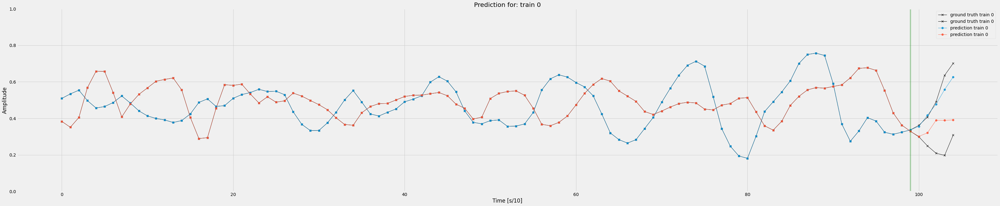

<Figure size 3600x720 with 0 Axes>

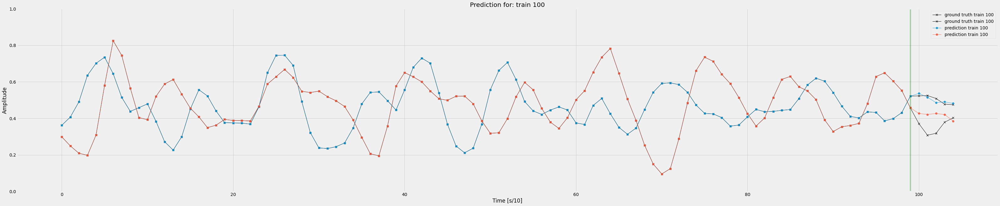

<Figure size 3600x720 with 0 Axes>

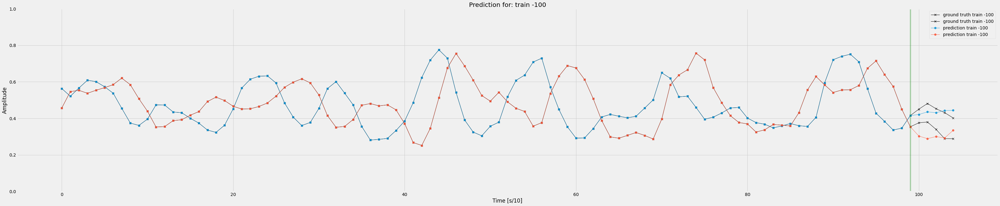

<Figure size 3600x720 with 0 Axes>

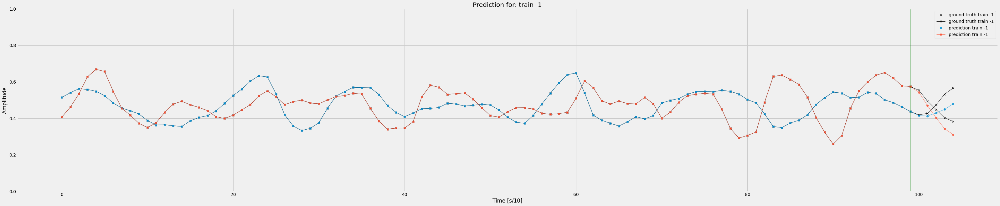

<Figure size 3600x720 with 0 Axes>

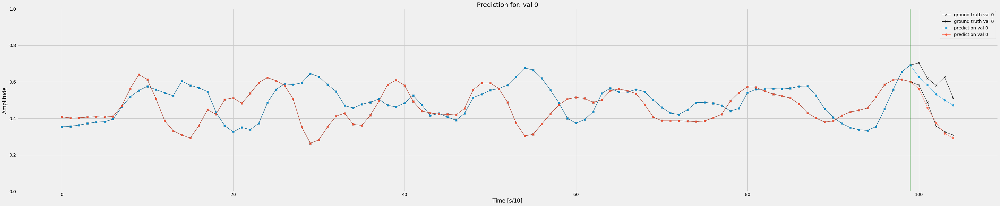

<Figure size 3600x720 with 0 Axes>

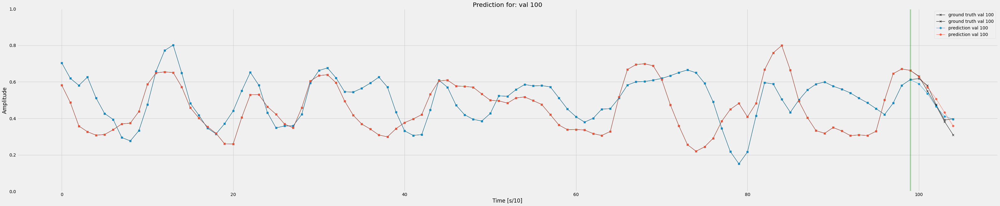

<Figure size 3600x720 with 0 Axes>

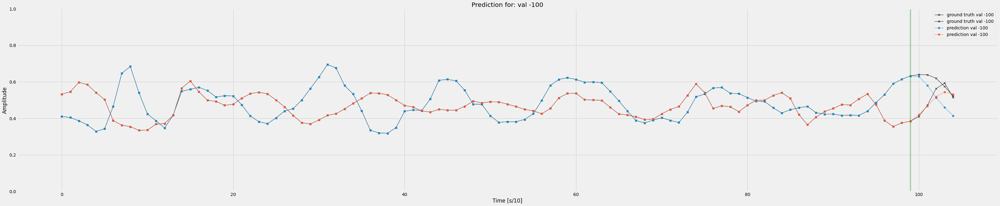

<Figure size 3600x720 with 0 Axes>

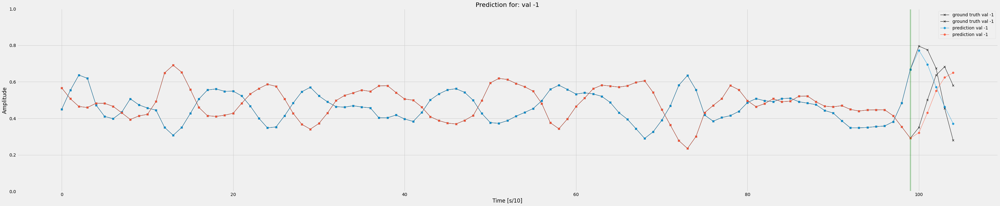

<Figure size 3600x720 with 0 Axes>

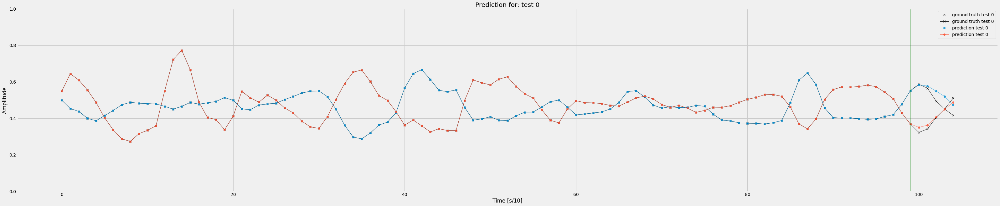

<Figure size 3600x720 with 0 Axes>

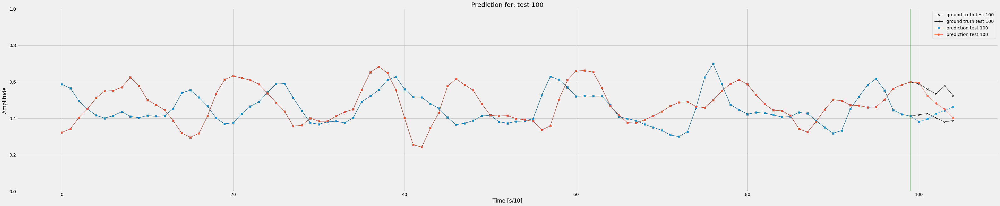

<Figure size 3600x720 with 0 Axes>

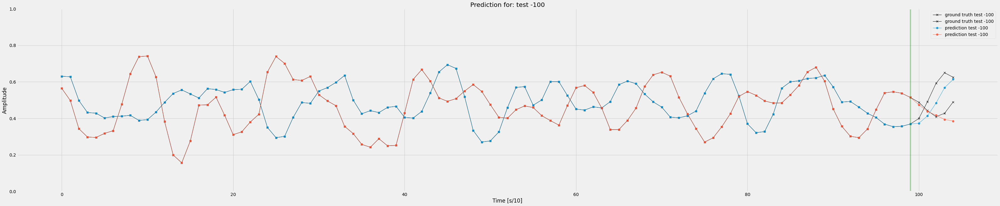

<Figure size 3600x720 with 0 Axes>

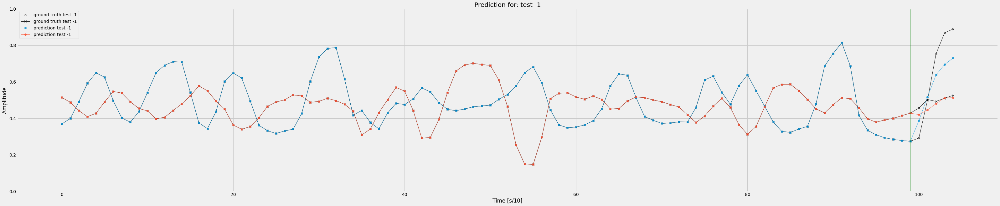

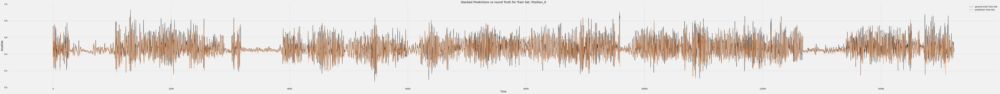

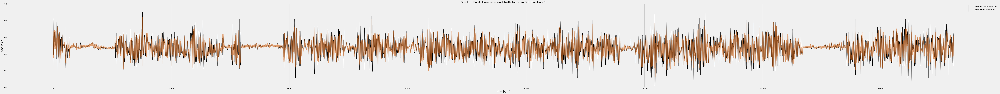

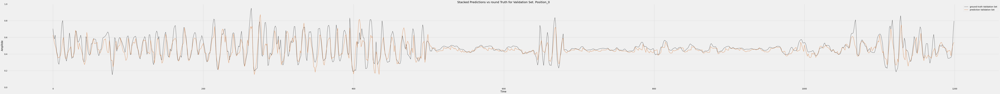

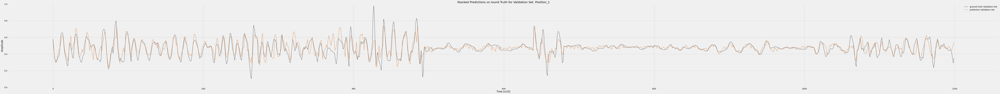

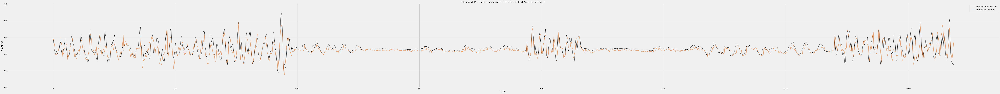

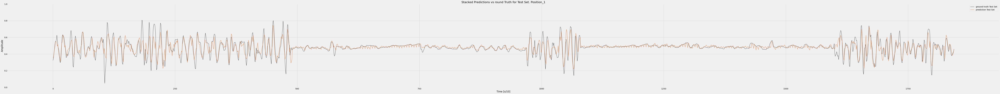

In [20]:
# Plot Results
plt.rcParams['figure.figsize'] = (50,10)
plot_compare(model, single = True, all = True, save_plots = sd['model_dir_save']+'plots/')

In [ ]:
# Recreate the exact same model, including its weights and the optimizer
model = tf.keras.models.load_model('models/20220121-182318_magnetic_a/20220121-182318_magnetic_a.h5')

# Show the model architecture

plt.rcParams['figure.figsize'] = (50,10)
plot_compare(model, single = True, all = True, save_plots = 'models/20220121-182318_magnetic_a/plots/')